# RNA velocity analysis of Smart-seq3 NC wildtype

Author: Zhiyuan Hu \
Date: 27 Jun 2022 \
Last modified: 25 Oct 2023

## Read data

In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import pandas as pd
import loompy
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.8.13) on 2023-10-27 16:03.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [2]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [3]:
# # combine three loom files from multiple batches
# loom_files = ['../data/velocyto_dump/nc01_zumi.loom','../data/velocyto_dump/nc02_zumi.loom','../data/velocyto_dump/nc03_zumi.loom',
# '../data/velocyto_dump/nc04_zumi.loom','../data/velocyto_dump/nc05_zumi.loom','../data/velocyto_dump/nc06_zumi.loom',
# '../data/velocyto_dump/nc07_zumi.loom','../data/velocyto_dump/nc08_zumi.loom']
# output_loom = '../data/loom/nc01to08_zumi.loom'
# loompy.combine(files = loom_files, output_file = output_loom)# combine three loom files from multiple batches


In [9]:
adata = scv.read('../data/loom/nc01to08_zumi.loom', cache=False)
adata

AnnData object with n_obs × n_vars = 3072 × 27599
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [10]:
adata_seurat = sc.read_h5ad('/home/huzhiy/projects_ox/smartseq3_nc/analysis/clustering/data/ss3_nc_wildtype.h5ad')

In [11]:
adata # this adata used ensembl98/99

AnnData object with n_obs × n_vars = 3072 × 27599
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [12]:
adata_seurat

AnnData object with n_obs × n_vars = 697 × 27599
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'ncount_rna', 'nfeature_rna', 'percent.mt', 'sample_id', 'sample', 'stage', 'genotype', 'doubletfinder', 'tssenrichment', 'readsintss', 'readsinpromoter', 'readsinblacklist', 'promoterratio', 'passqc', 'nucleosomeratio', 'nmultifrags', 'nmonofrags', 'nfrags', 'ndifrags', 'doubletscore', 'doubletenrichment', 'blacklistratio', 'demuxlet_singlet', 'rna_snn_res.0.6', 'seurat_clusters', 'major_clusters', 'ntornc', 'rna_snn_res.0.8', 'major_clusters_ntnnc', 'rna_snn_res.1', 'genotype_new', 's.score', 'g2m.score', 'phase', 'old.ident', 'cell_type', 'method', 'batch', 'sampleid', 'well', 'x96wplate', 'x384wplate', 'facsgate', 'note', 'conc', 'index1name', 'index1sequence', 'index2name', 'index2sequence', 'barcode', 'cell_name', 'citrine_counts', 'mcherry_counts', 'citrine_umis', 'mcherry_umis', 'foxd3_counts', 'foxd3_umis', 'umi_reads_ratio', 'rna_snn_res.0.5', 'pann_0.25_0.005_212', 'df.class

In [13]:
adata.obs_names

Index(['nc01_zumi:AAGAGGCACTAGTCGAx', 'nc01_zumi:AGGCAGAACGGAGAGAx',
       'nc01_zumi:ATGCGCAGATTAGACGx', 'nc01_zumi:AAGAGGCACTCCTTACx',
       'nc01_zumi:ATGCGCAGATAGAGAGx', 'nc01_zumi:ATCTCAGGAGAGGATAx',
       'nc01_zumi:ATCTCAGGCTTAATAGx', 'nc01_zumi:ACTGAGCGTAAGGCTCx',
       'nc01_zumi:ATCTCAGGTCGCATAAx', 'nc01_zumi:ATCTCAGGTACTCCTTx',
       ...
       'nc08_zumi:TCCTGAGCACTCTAGGx', 'nc08_zumi:TAGCGCTCCTAGTCGAx',
       'nc08_zumi:TAGCGCTCTATGCAGTx', 'nc08_zumi:TCGACGTCCTAGTCGAx',
       'nc08_zumi:TGCAGCTATCTTACGCx', 'nc08_zumi:TACGCTGCTCGCATAAx',
       'nc08_zumi:TCCTGAGCTATGCAGTx', 'nc08_zumi:TCCTGAGCATAGCCTTx',
       'nc08_zumi:TAGGCATGTACTCCTTx', 'nc08_zumi:TAGGCATGCTAGTCGAx'],
      dtype='object', name='CellID', length=3072)

In [14]:
adata_seurat.obs_names

Index(['nc01_zumi:AAGAGGCAAGAGGATAx', 'nc01_zumi:AAGAGGCAAGGCTTAGx',
       'nc01_zumi:AAGAGGCAATAGCCTTx', 'nc01_zumi:AAGAGGCACGGAGAGAx',
       'nc01_zumi:AAGAGGCATATGCAGTx', 'nc01_zumi:AAGAGGCATCGCATAAx',
       'nc01_zumi:AAGAGGCATCTTACGCx', 'nc01_zumi:ACTCGCTAAGAGGATAx',
       'nc01_zumi:ACTCGCTAAGCTAGAAx', 'nc01_zumi:ACTCGCTAAGGCTTAGx',
       ...
       'nc08_zumi:TCGACGTCACTCTAGGx', 'nc08_zumi:TCGACGTCAGAGGATAx',
       'nc08_zumi:TCGACGTCAGCTAGAAx', 'nc08_zumi:TCGACGTCAGGCTTAGx',
       'nc08_zumi:TCGACGTCATAGAGAGx', 'nc08_zumi:TCGACGTCATAGCCTTx',
       'nc08_zumi:TCGACGTCATTAGACGx', 'nc08_zumi:TCGACGTCTACTCCTTx',
       'nc08_zumi:TCGACGTCTATGCAGTx', 'nc08_zumi:TCGACGTCTCTTACGCx'],
      dtype='object', length=697)

In [15]:
adata = adata[adata_seurat.obs_names]
adata

View of AnnData object with n_obs × n_vars = 697 × 27599
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [16]:
adata = scv.utils.merge(adata, adata_seurat)
adata

AnnData object with n_obs × n_vars = 697 × 26938
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'ncount_rna', 'nfeature_rna', 'percent.mt', 'sample_id', 'sample', 'stage', 'genotype', 'doubletfinder', 'tssenrichment', 'readsintss', 'readsinpromoter', 'readsinblacklist', 'promoterratio', 'passqc', 'nucleosomeratio', 'nmultifrags', 'nmonofrags', 'nfrags', 'ndifrags', 'doubletscore', 'doubletenrichment', 'blacklistratio', 'demuxlet_singlet', 'rna_snn_res.0.6', 'seurat_clusters', 'major_clusters', 'ntornc', 'rna_snn_res.0.8', 'major_clusters_ntnnc', 'rna_snn_res.1', 'genotype_new', 's.score', 'g2m.score', 'phase', 'old.ident', 'cell_type', 'method', 'batch', 'sampleid', 'well', 'x96wplate', 'x384wplate', 'facsgate', 'note', 'conc', 'index1name', 'index1sequence', 'index2name', 'index2sequence', 'barcode', 'cell_name', 'citrine_counts', 'mcherry_counts', 'citrine_umis', 'mcherry_umis', 'foxd3_counts', 'foxd3_umis', 'umi

In [17]:
adata.var

,Accession,Chromosome,End,Start,Strand,features
Gene,,,,,,
rpl24,ENSDARG00000099104,1,12027,6408,-,rpl24
tmem39a,ENSDARG00000102746,1,44565,39313,-,tmem39a
ildr1a,ENSDARG00000103929,1,50247,44839,-,ildr1a
si:zfos-1011f11.2,ENSDARG00000101073,1,65017,60979,-,si:zfos-1011f11.2
gpa33a,ENSDARG00000100223,1,71523,65705,-,gpa33a
...,...,...,...,...,...,...
mt-nd4,ENSDARG00000063917,MT,12679,11299,+,mt-nd4
mt-nd5,ENSDARG00000063921,MT,14717,12897,+,mt-nd5
mt-cyb,ENSDARG00000063924,MT,16448,15308,+,mt-cyb


In [18]:
adata.obs['clusters'] = adata.obs['seurat_clusters']
adata.obs

,initial_size_spliced,initial_size_unspliced,initial_size,orig.ident,nCount_RNA,nFeature_RNA,ncount_rna,nfeature_rna,percent.mt,sample_id,...,mcherry_umis,foxd3_counts,foxd3_umis,umi_reads_ratio,rna_snn_res.0.5,pann_0.25_0.005_212,df.classifications_0.25_0.005_212,df.classifications_0.25_0.005_198,integrated_snn_res.0.5,clusters
CellID,,,,,,,,,,,,,,,,,,,,,
nc01_zumi:AAGAGGCAAGAGGATAx,1037744,119930,1037744.0,nc01,1190889.0,8388,1190889.0,8388,6.147676,NA,...,0.0,1.0,1.0,0.194863,2,0.052632,Singlet,Singlet,9,9
nc01_zumi:AAGAGGCAAGGCTTAGx,862787,93066,862787.0,nc01,989640.0,7222,989640.0,7222,7.018916,NA,...,0.0,4.0,4.0,0.185113,14,0.000000,Singlet,Singlet,13,13
nc01_zumi:AAGAGGCAATAGCCTTx,1143125,118655,1143125.0,nc01,1313100.0,8486,1313100.0,8486,8.265174,NA,...,1.0,1.0,1.0,0.198836,16,0.105263,Singlet,Singlet,3,3
nc01_zumi:AAGAGGCACGGAGAGAx,1162138,140692,1162138.0,nc01,1338100.0,6865,1338100.0,6865,5.361931,NA,...,2.0,6.0,4.0,0.150552,3,0.052632,Singlet,Singlet,10,10
nc01_zumi:AAGAGGCATATGCAGTx,970577,134807,970577.0,nc01,1141726.0,6193,1141726.0,6193,8.461838,NA,...,0.0,0.0,0.0,0.159753,3,0.052632,Singlet,Singlet,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nc08_zumi:TCGACGTCATAGCCTTx,1051932,119907,1051932.0,nc08,1195040.0,7434,1195040.0,7434,4.299689,NA,...,0.0,1.0,1.0,0.162826,3,0.000000,Singlet,Singlet,10,10
nc08_zumi:TCGACGTCATTAGACGx,280854,31462,280854.0,nc08,320097.0,6918,320097.0,6918,3.827277,NA,...,1.0,31.0,5.0,0.239852,0,0.052632,Singlet,Singlet,12,12
nc08_zumi:TCGACGTCTACTCCTTx,551823,84759,551823.0,nc08,649250.0,8657,649250.0,8657,5.577821,NA,...,6.0,55.0,14.0,0.228812,10,0.105263,Singlet,Singlet,10,10


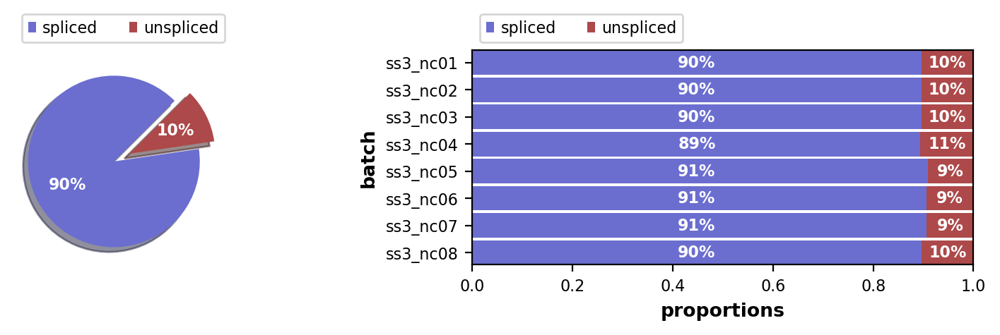

In [19]:
adata.obs['batch'] = adata.obs['batch'].astype("category")
scv.pl.proportions(adata, groupby = 'batch')

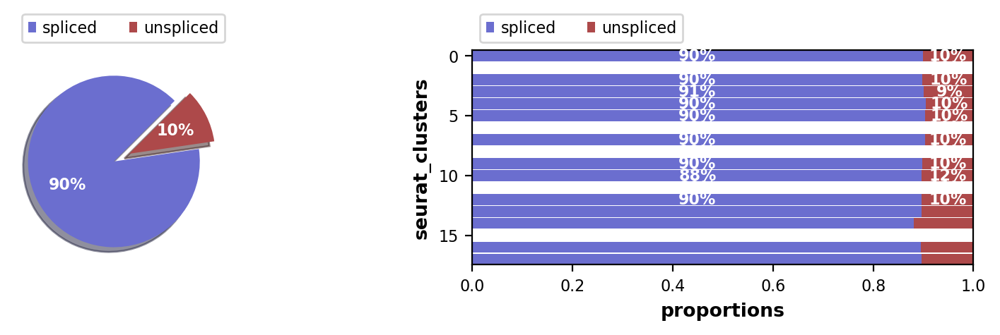

In [20]:
adata.obs['seurat_clusters'] = adata.obs['seurat_clusters'].astype("category")
scv.pl.proportions(adata, groupby = 'seurat_clusters')

## Preprocessing the data

In [21]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata,enforce=True)
scv.pp.filter_genes_dispersion(adata, n_top_genes=3000)
scv.pp.log1p(adata)

Filtered out 9114 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.


In [22]:
sc.tl.tsne(adata, n_pcs=30)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [23]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=10)

computing neighbors
    finished (0:00:07) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


## Estimate RNA velocity

In [24]:
## scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/48 cores)


  0%|          | 0/697 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Project the velocities

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


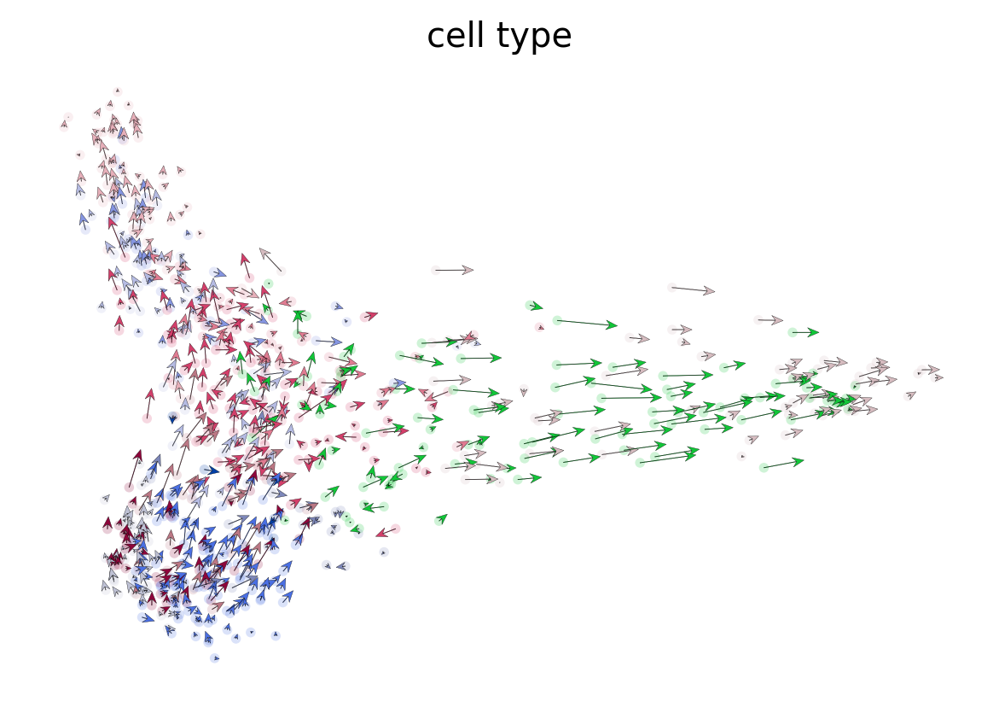

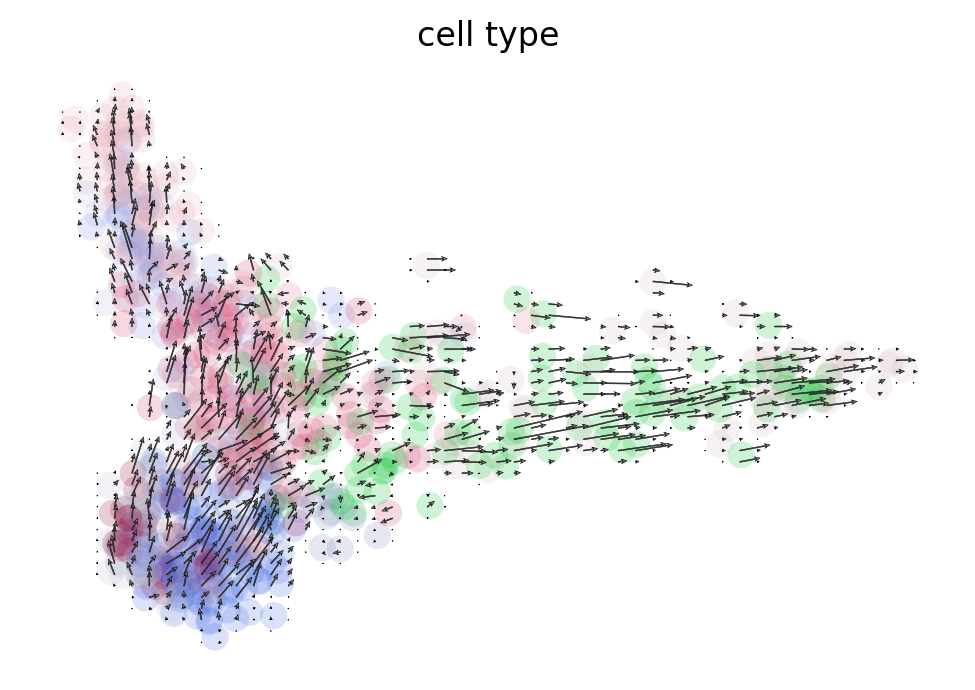

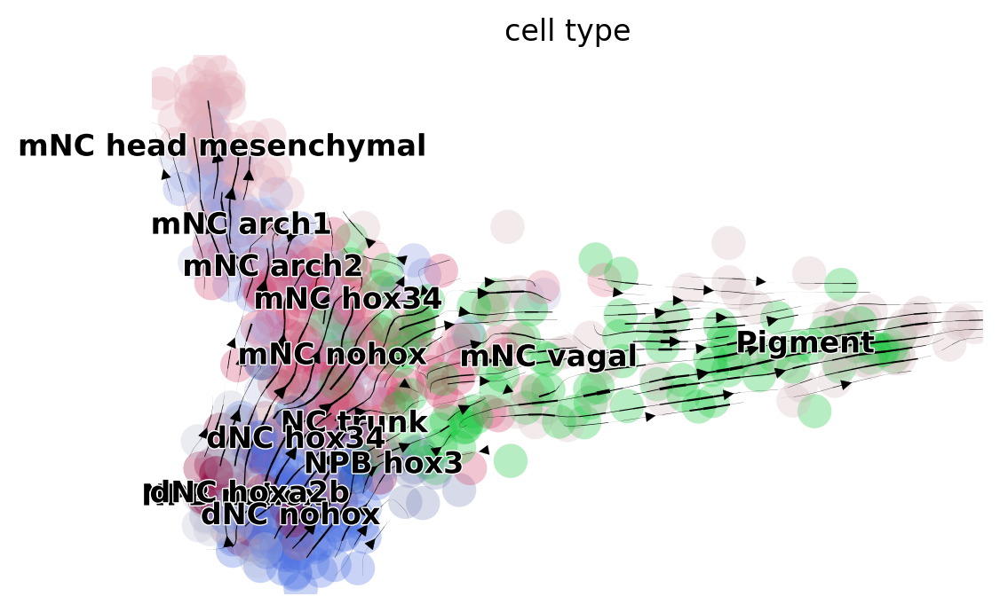

In [25]:
scv.pl.velocity_embedding(adata, basis='pca', color='cell_type', arrow_length=3, arrow_size=2, dpi=120)
scv.pl.velocity_embedding_grid(adata, basis='pca', color='cell_type',arrow_length=3)
scv.pl.velocity_embedding_stream(adata, basis='pca', color='cell_type')

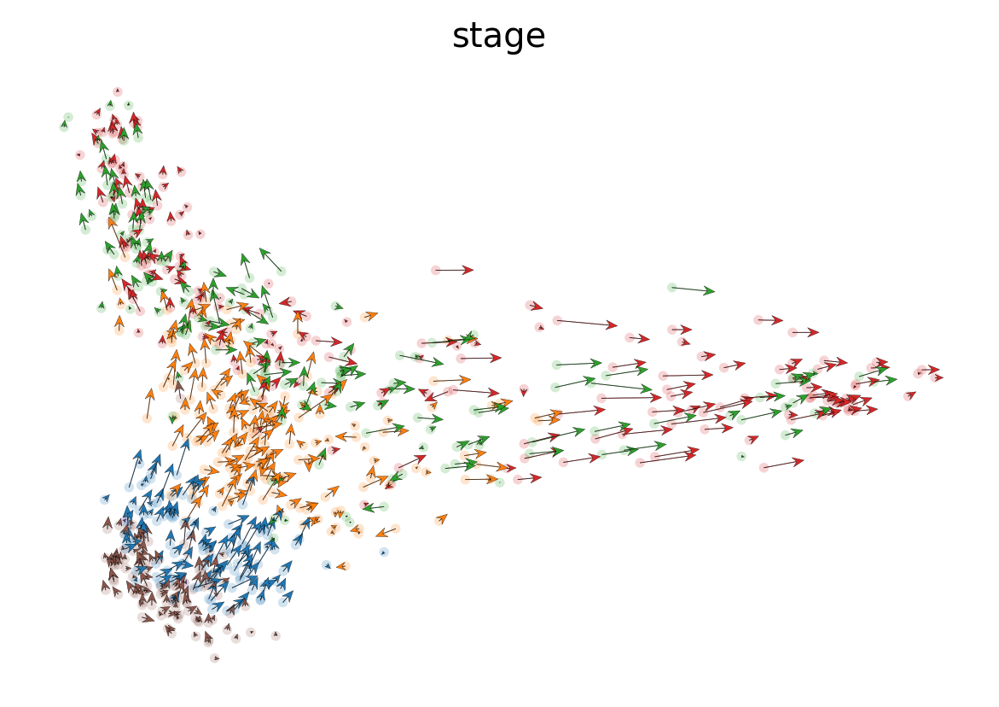

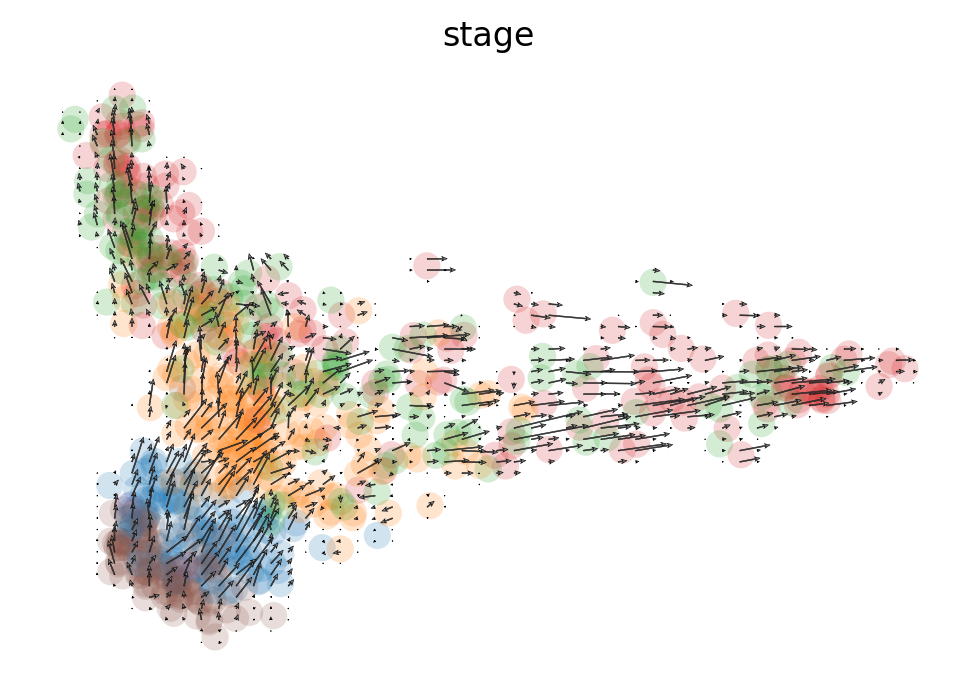

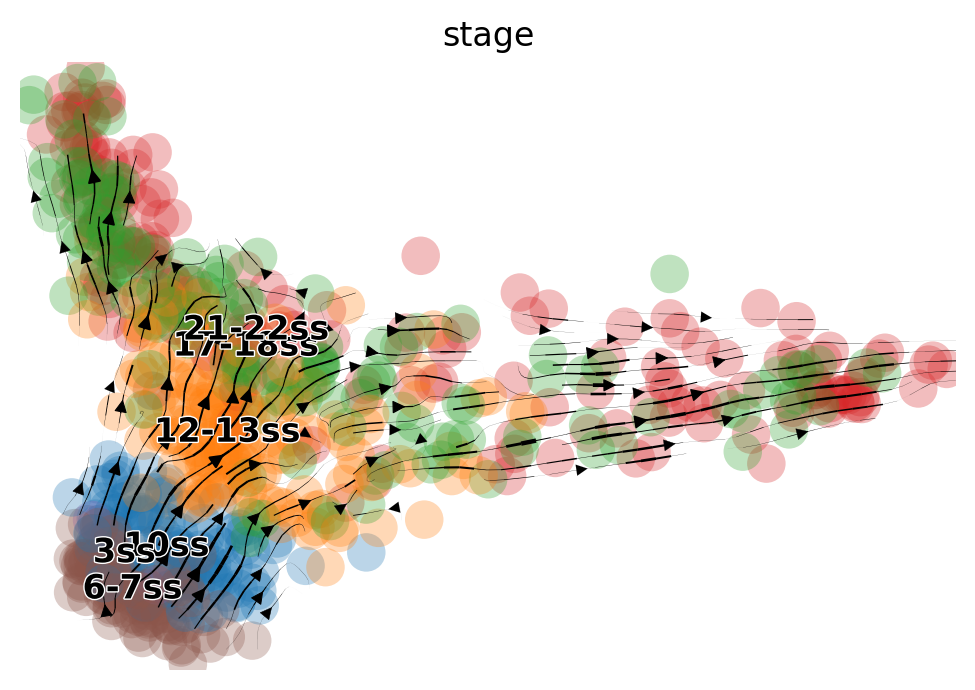

In [26]:
scv.pl.velocity_embedding(adata, basis='pca', color='stage', arrow_length=3, arrow_size=2, dpi=120)
scv.pl.velocity_embedding_grid(adata, basis='pca', color='stage',arrow_length=3)
scv.pl.velocity_embedding_stream(adata, basis='pca', color='stage')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_tsne', embedded velocity vectors (adata.obsm)


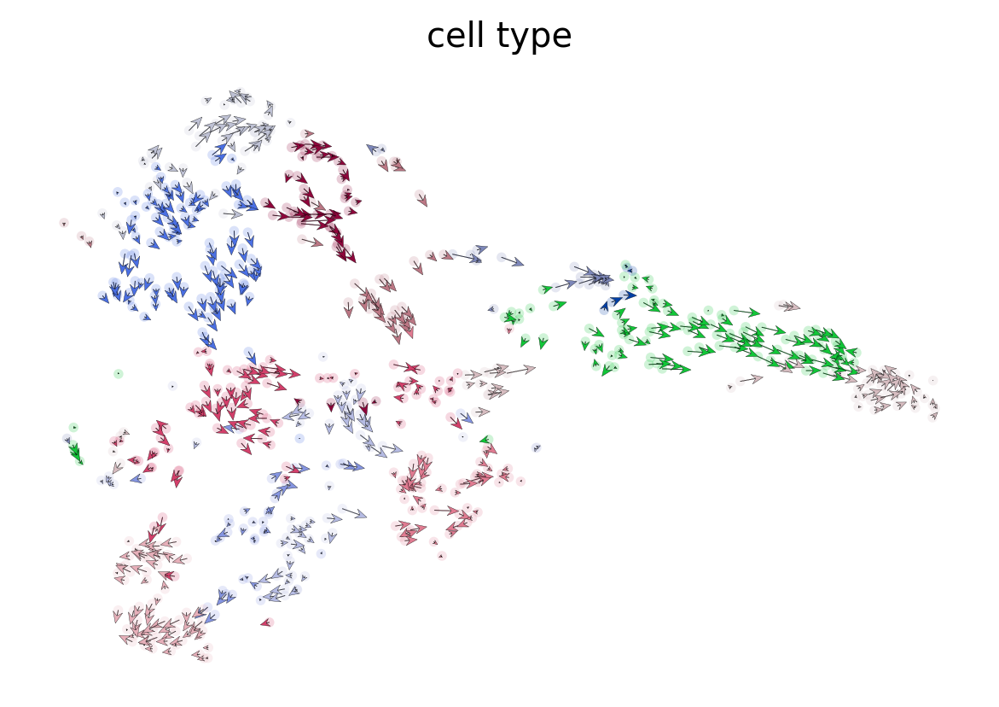

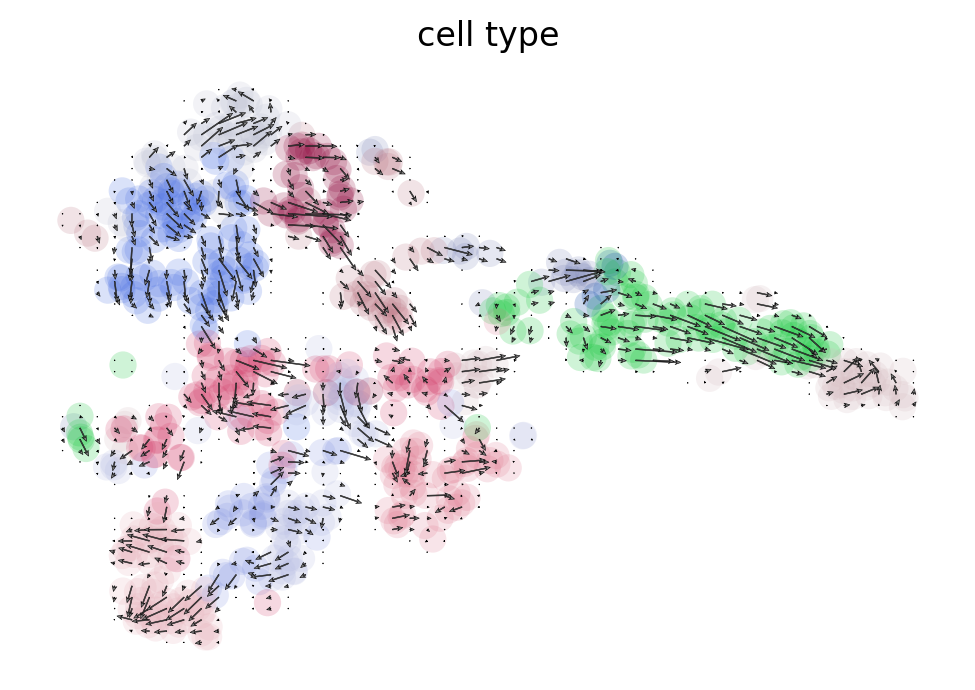

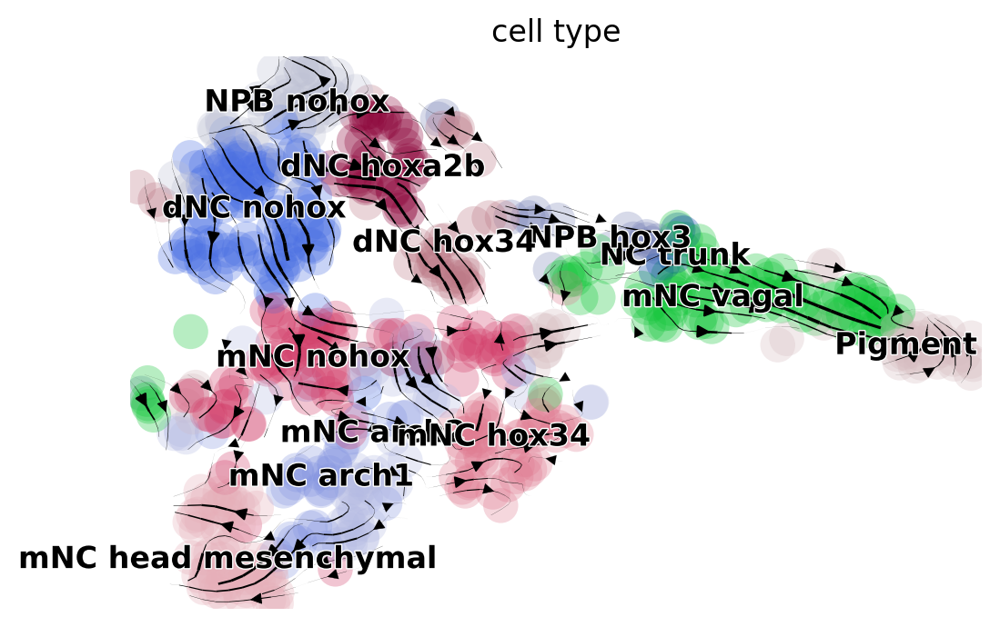

In [27]:
scv.pl.velocity_embedding(adata, basis='tsne', color='cell_type', arrow_length=3, arrow_size=2, dpi=120)
scv.pl.velocity_embedding_grid(adata, basis='tsne', color='cell_type',arrow_length=3)
scv.pl.velocity_embedding_stream(adata, basis='tsne', color='cell_type')

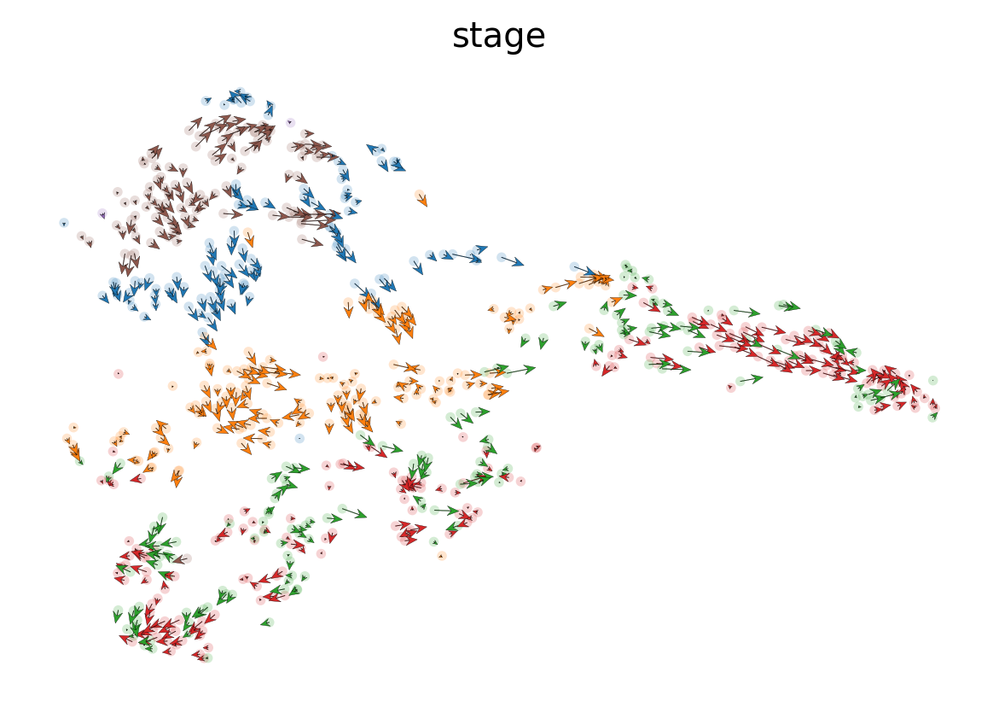

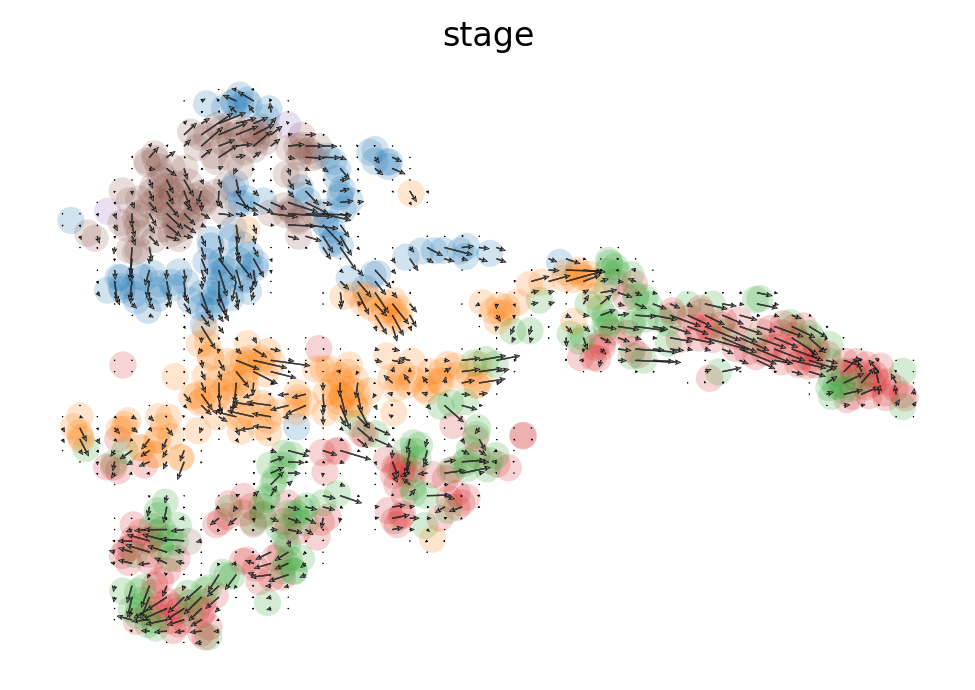

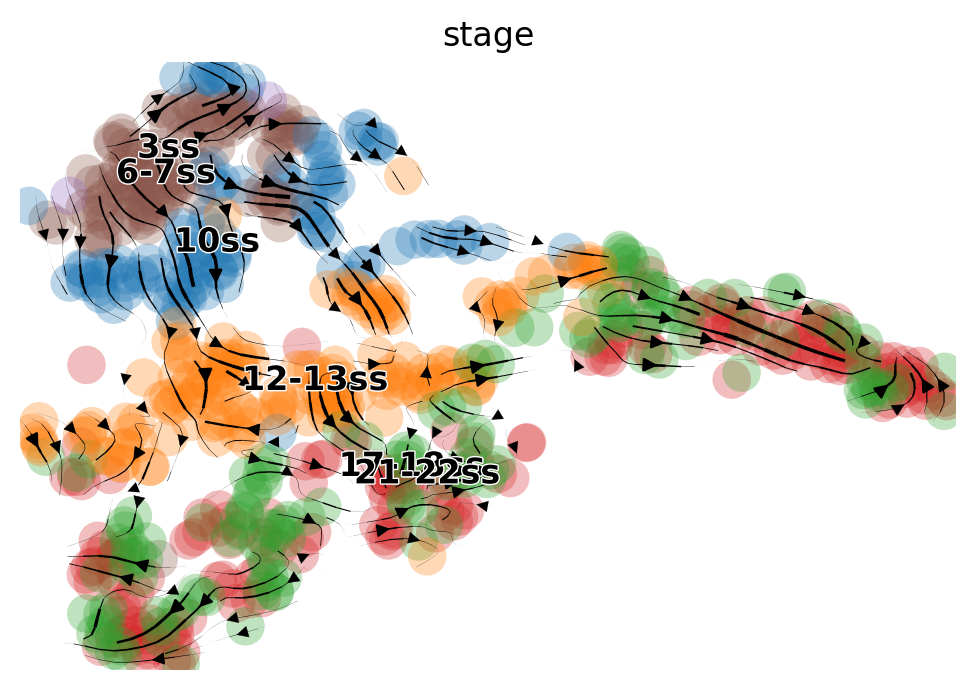

In [28]:
scv.pl.velocity_embedding(adata, basis='tsne', color='stage', arrow_length=3, arrow_size=2, dpi=120)
scv.pl.velocity_embedding_grid(adata, basis='tsne', color='stage',arrow_length=3)
scv.pl.velocity_embedding_stream(adata, basis='tsne', color='stage')

## Inteprete the velocities

In [29]:
scv.tl.rank_velocity_genes(adata, groupby='cell_type', min_corr=.3)

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [30]:
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df_scores = scv.DataFrame(adata.uns['rank_velocity_genes']['scores'])

In [31]:
df.head(15)

,NC_trunk,NPB_hox3,NPB_nohox,Pigment,dNC_hox34,dNC_hoxa2b,dNC_nohox,mNC_arch1,mNC_arch2,mNC_head_mesenchymal,mNC_hox34,mNC_nohox,mNC_vagal
0,fgfr4,hoxd3a,hsp70.2,slc36a1,si:dkey-10o6.2,meis1b,CU207354.1,cxcl12b,notch2,lamc3,shroom4,pmp22a,elf1
1,hoxb7a,ptprfa,kcnab1a,pcdh9,sema3fa,efnb2a,nrp2a,ebf3a,si:ch211-263k4.2,ENSDARG00000053091,ENSDARG00000042329,psd2,hhatla
2,nr6a1b,sema3fa,col15a1b,CT573279.1,bmper,meis3,kcnab1a,chst11,tpm4a,slit3,itga3a,tes,pcbp4
3,hoxa9a,arhgef28a,hsp70.1,mgat4b,cxcl12a,fabp3,actb1,pmp22a,gdf11,tgfbr2b,acy3.2,gfra4b,hoxd3a
4,hoxc3a,tshz3b,tle2a,elf1,si:dkey-85n7.6,lamb1a,csf1a,orc5,chst11,ednraa,hivep3b,plpp3,arhgef28a
5,rgmd,erbb3b,cdon,epas1a,nucb2b,sema3d,hsp70.2,ednraa,hoxb3a,pbx1a,myo10l3,krt18b,slc36a1
6,fabp3,ppp1r1c,ek1,itga1,kalrnb,mdkb,ednrab,tpm4a,ppat,itga8,gdf11,pikfyve,atr
7,dnmt1,bicd1a,tacc3,CU138533.1,hoxb3a,snai1b,col15a1b,fgfr1b,si:ch73-215f7.1,asap3,tshz3b,nrp2a,phactr3a
8,ppp1r1c,kalrnb,cdca8,gpm6ab,slc9a3r1a,hmmr,nr4a2b,si:ch211-198m17.1,pmp22a,pdia4,si:dkey-85n7.6,f3b,CR854839.1
9,zgc:152830,si:dkey-1h24.2,g2e3,gga3a,ppp1r14ab,si:ch211-156j22.4,col18a1a,plk2a,ebf2,acy3.2,rflnb,sorbs1,ctsba


In [32]:
df_scores.head(15)

,NC_trunk,NPB_hox3,NPB_nohox,Pigment,dNC_hox34,dNC_hoxa2b,dNC_nohox,mNC_arch1,mNC_arch2,mNC_head_mesenchymal,mNC_hox34,mNC_nohox,mNC_vagal
0,9.07,8.53,12.81,10.22,7.26,6.77,10.56,12.41,10.15,14.37,8.27,10.91,12.54
1,8.23,7.99,11.88,9.35,7.00,5.83,9.81,7.95,9.65,14.00,7.84,9.28,11.88
2,8.05,7.61,11.11,8.84,6.93,5.79,9.31,7.93,6.91,13.63,7.02,8.95,11.37
3,5.69,5.30,9.19,8.59,5.74,5.62,8.73,6.95,6.76,13.03,6.54,8.19,9.96
4,5.61,4.92,7.96,8.08,5.39,5.47,8.37,6.50,6.27,12.45,6.43,7.47,9.82
5,5.38,4.82,7.80,7.73,5.31,5.28,8.21,6.21,6.10,10.53,6.33,6.33,9.62
6,4.55,4.23,7.43,7.22,5.28,4.43,7.84,6.04,5.99,9.80,6.23,6.32,9.37
7,4.46,4.08,7.17,7.01,5.04,4.21,7.54,5.51,5.96,9.65,6.15,6.30,8.56
8,4.24,3.98,7.08,6.99,4.95,4.19,7.37,5.22,5.89,9.57,5.91,5.90,8.48
9,3.67,3.71,7.02,6.85,4.86,4.05,7.02,5.18,5.72,9.29,5.74,5.81,8.20


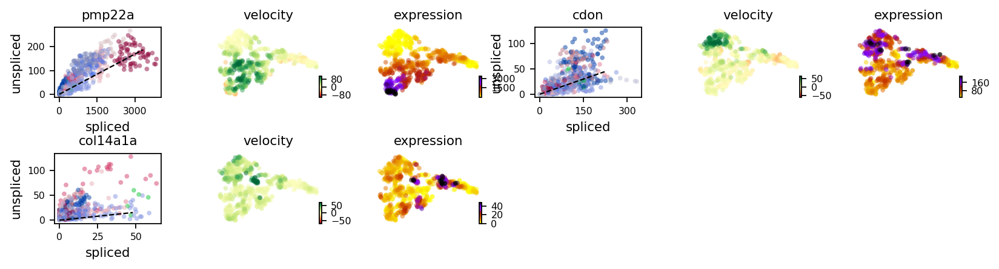

In [33]:
scv.pl.velocity(adata, ['pmp22a','fgfr3','cdon','pax3','ptprn2','col14a1a'], basis = "tsne", ncols=2)

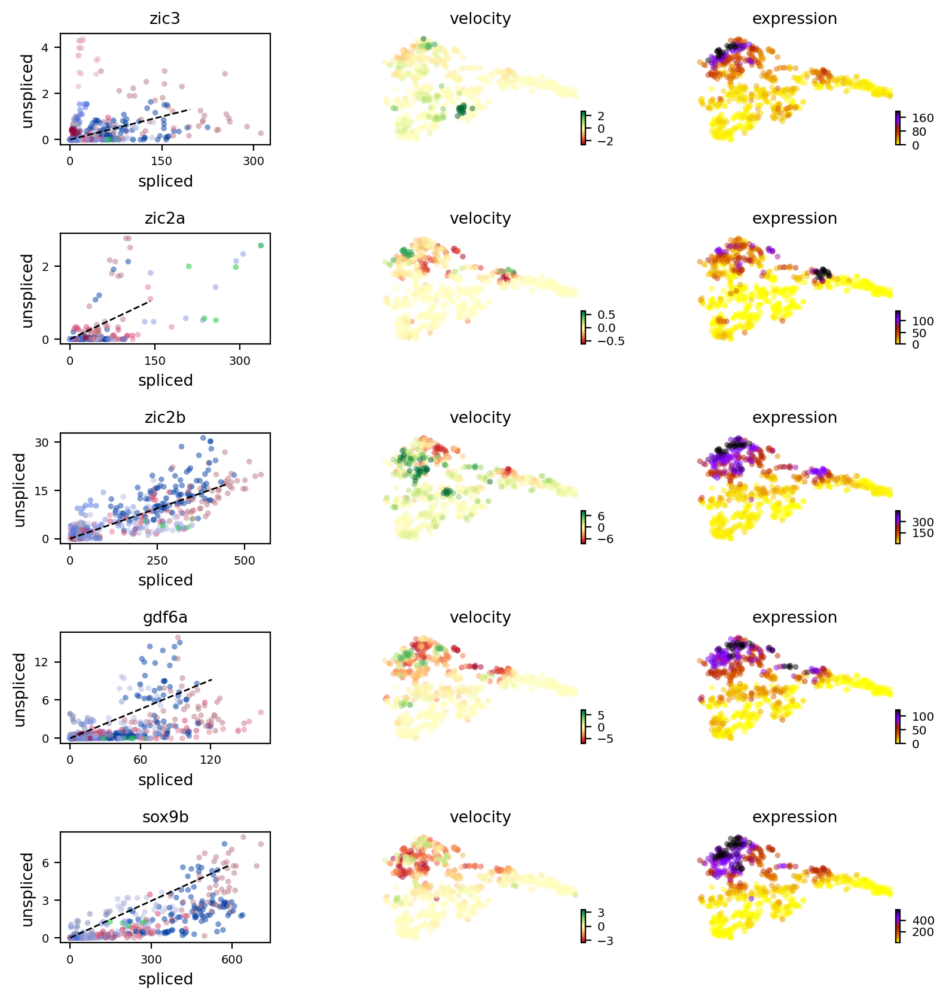

In [34]:
scv.pl.velocity(adata, ["zic3","zic2a","zic2b", "gdf6a", "wnt3","sox9b"], basis = "tsne", ncols=1)

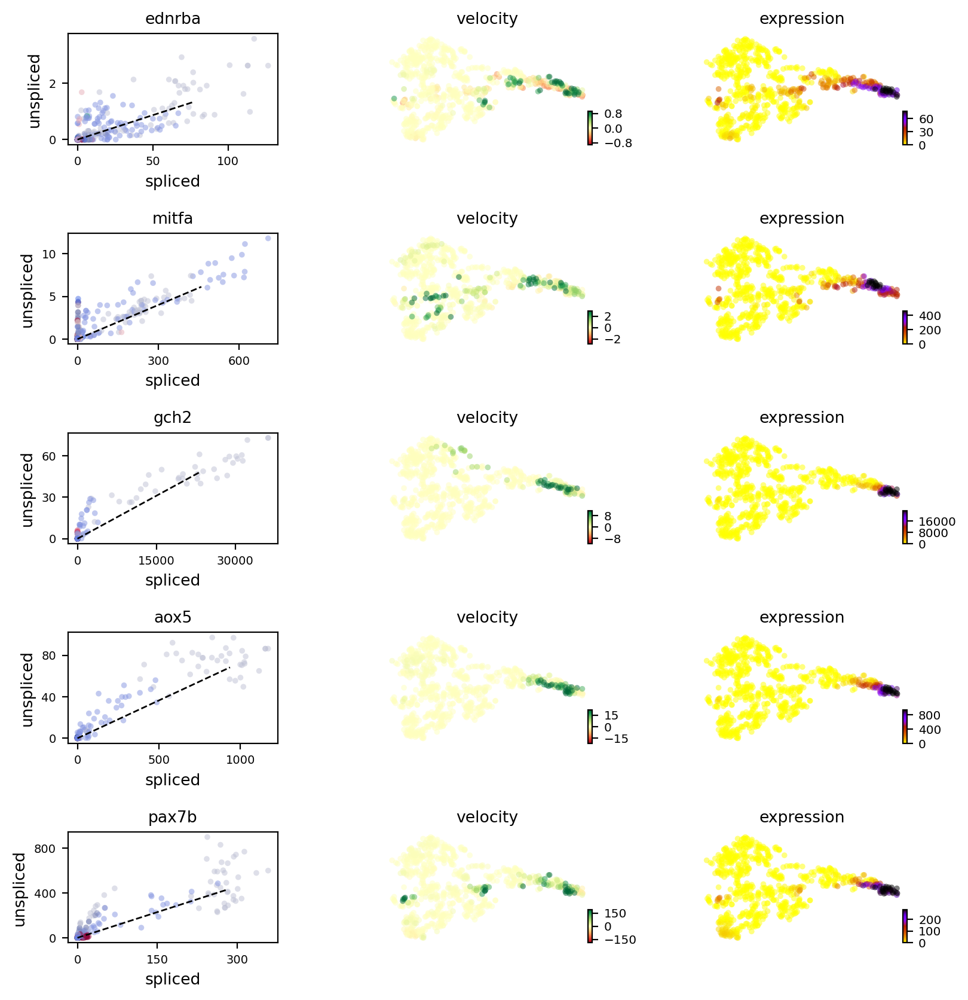

In [35]:
scv.pl.velocity(adata, ["ednrba","mitfa","gch2","aox5","pax7b"], basis = "tsne", ncols=1)

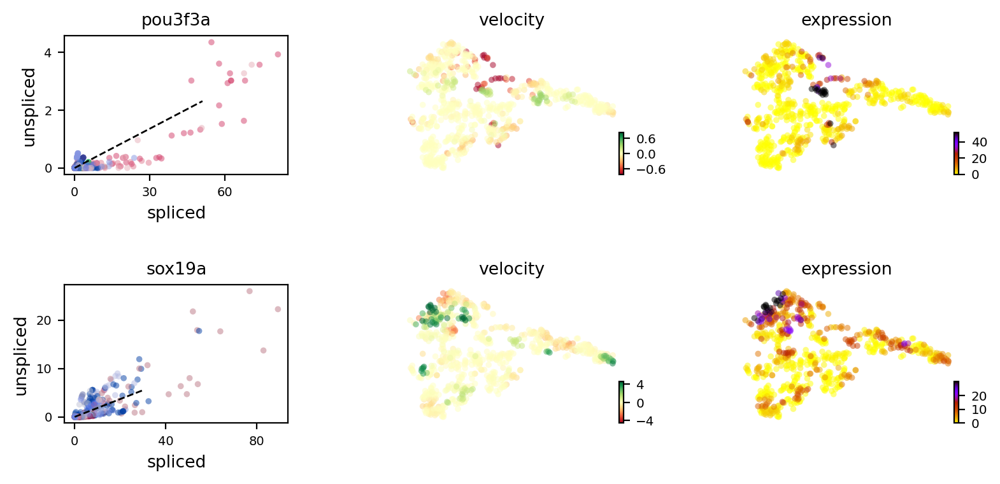

In [36]:
scv.pl.velocity(adata, ["fgfbp3","crb1","rfx4","pou3f3b","pou3f1","pou3f3a","sox21a","sox3","sox19a"], basis = "tsne", ncols=1)

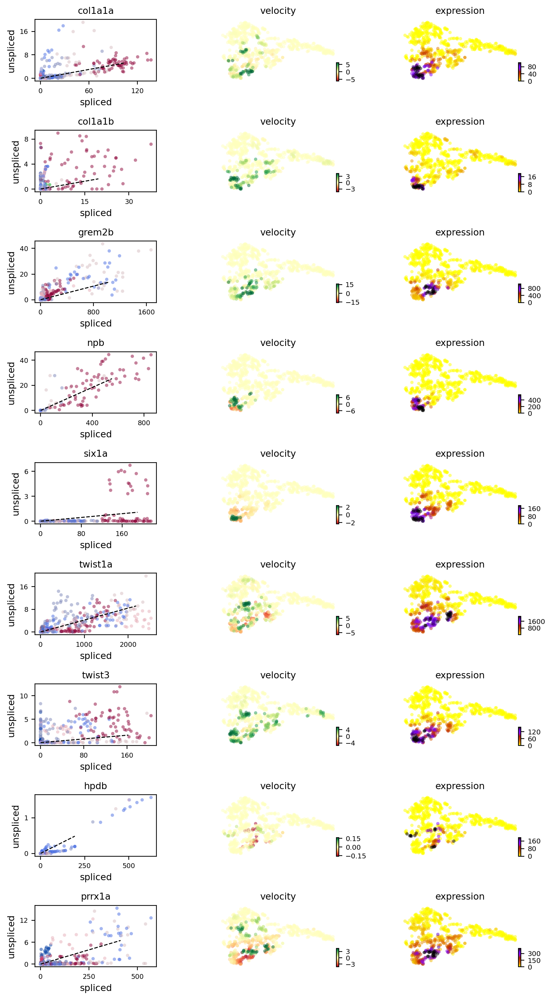

In [37]:
scv.pl.velocity(adata, ["col1a1a","col1a1b","grem2b","npb","six1a","foxd2","twist1a", "twist3","hpdb","prrx1a"], basis = "tsne", ncols=1)

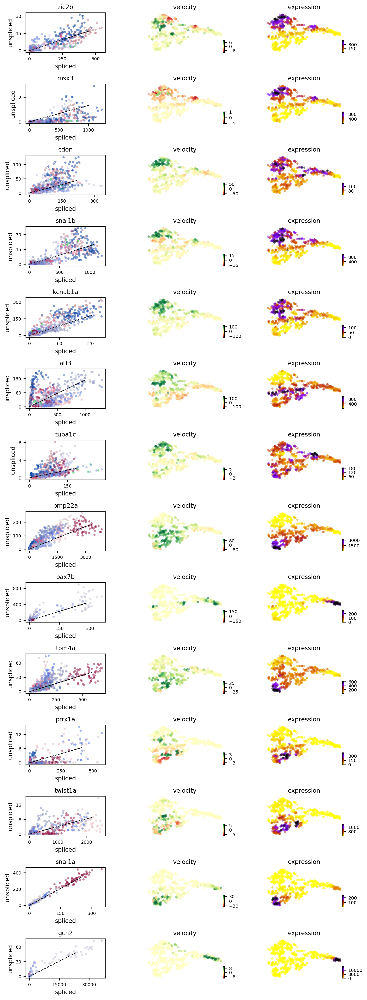

In [38]:
scv.pl.velocity(adata, ["zic2b","msx3","cdon",
                       "snai1b","kcnab1a","atf3","tuba1c",
                       "pmp22a","pax7b","tpm4a","prrx1a","twist1a","ipar1","snai1a","cadm1a","gch2","mfsd11"],
                basis = "tsne", ncols=1)

## Velocities in cycling progenitors

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


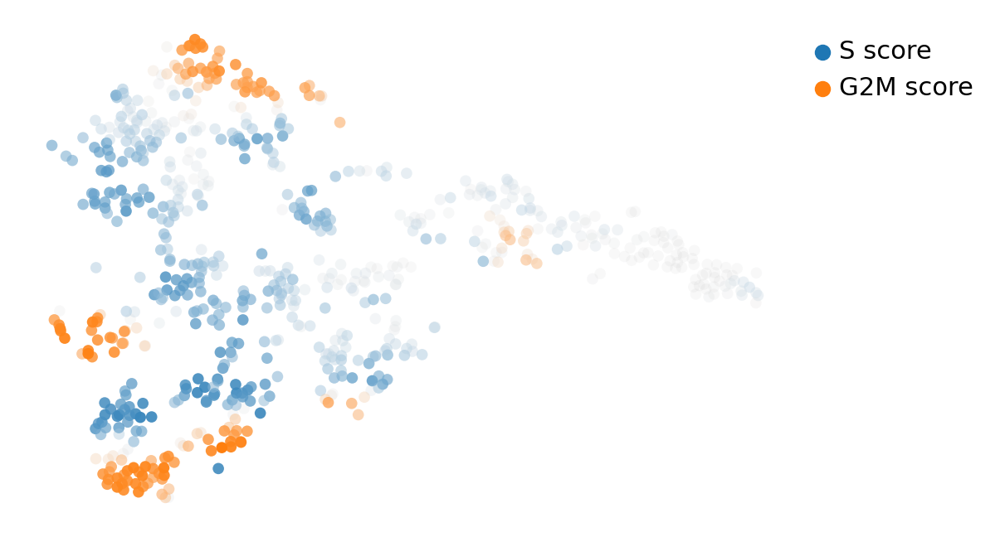

In [39]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], basis = "tsne", smooth=True, perc=[5,95])

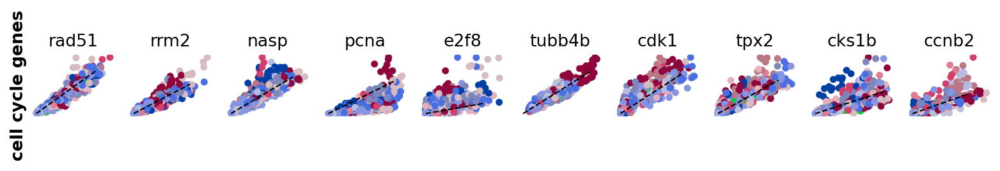

In [40]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adata)
s_genes = scv.get_df(adata[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adata[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adata, list(s_genes[:5] ) + list(g2m_genes[:5]), **kwargs)

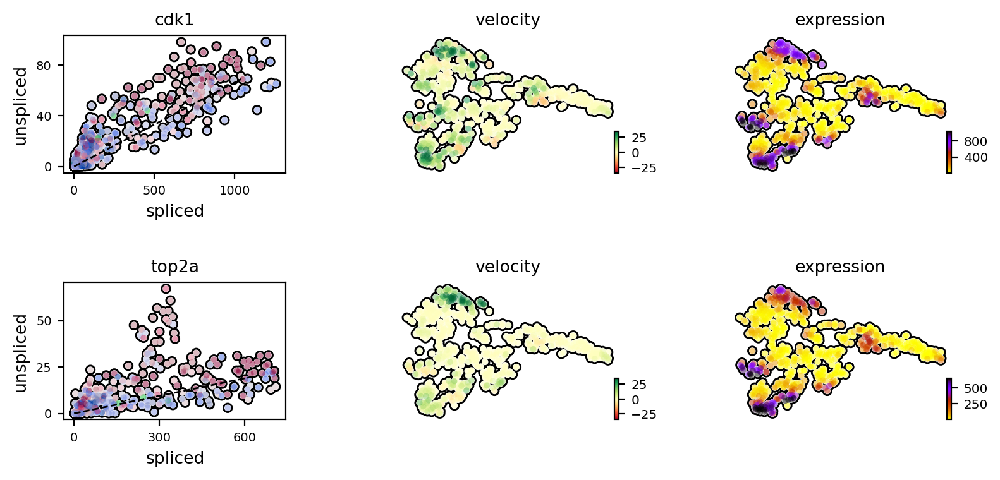

In [41]:
scv.pl.velocity(adata, ['cdk1', 'top2a'], basis = 'tsne',ncols=1, add_outline=True)

## Speed and coherence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


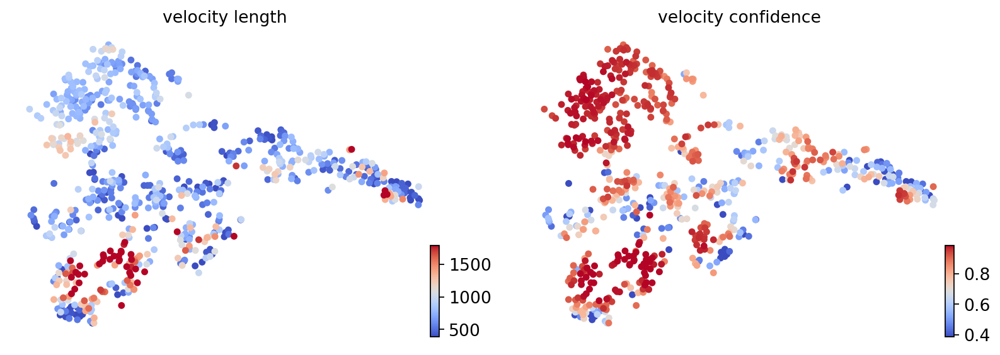

In [42]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, basis = "tsne",cmap='coolwarm', perc=[5, 95])

In [43]:
df = adata.obs.groupby('seurat_clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

seurat_clusters,0,2,3,4,5,7,9,10,12,13,14,16,17
velocity_length,873.410950,666.446045,798.598572,1466.858032,805.626587,1059.870117,1050.457031,743.942444,689.911682,880.526062,470.957367,719.234070,573.781982
velocity_confidence,0.953116,0.697653,0.648077,0.845491,0.957500,0.805554,0.804036,0.660537,0.890181,0.714802,0.661173,0.853765,0.745275


## Velocities and pseudotime

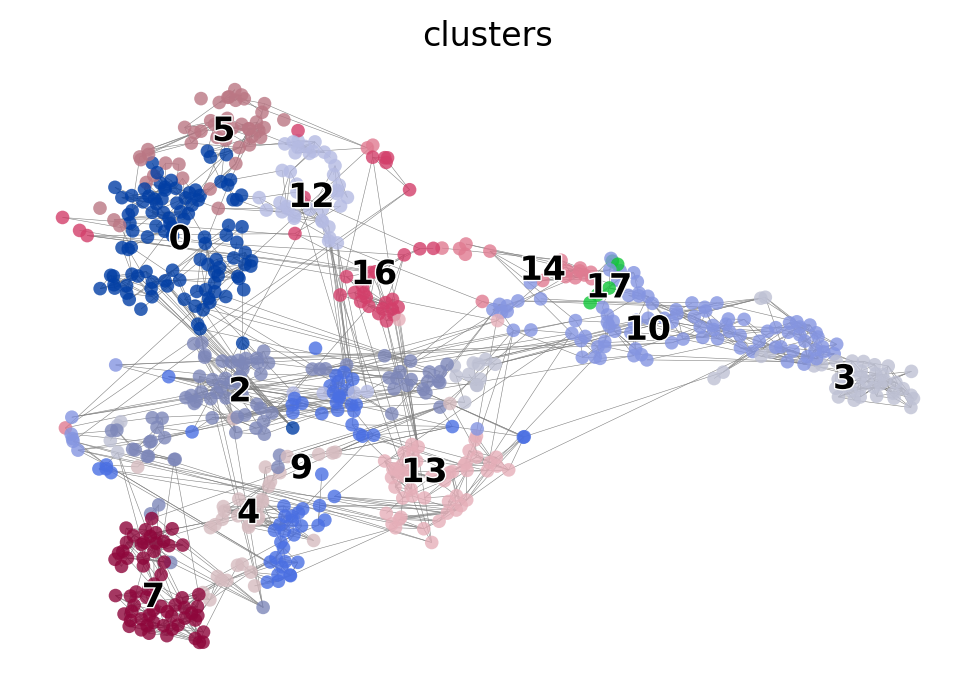

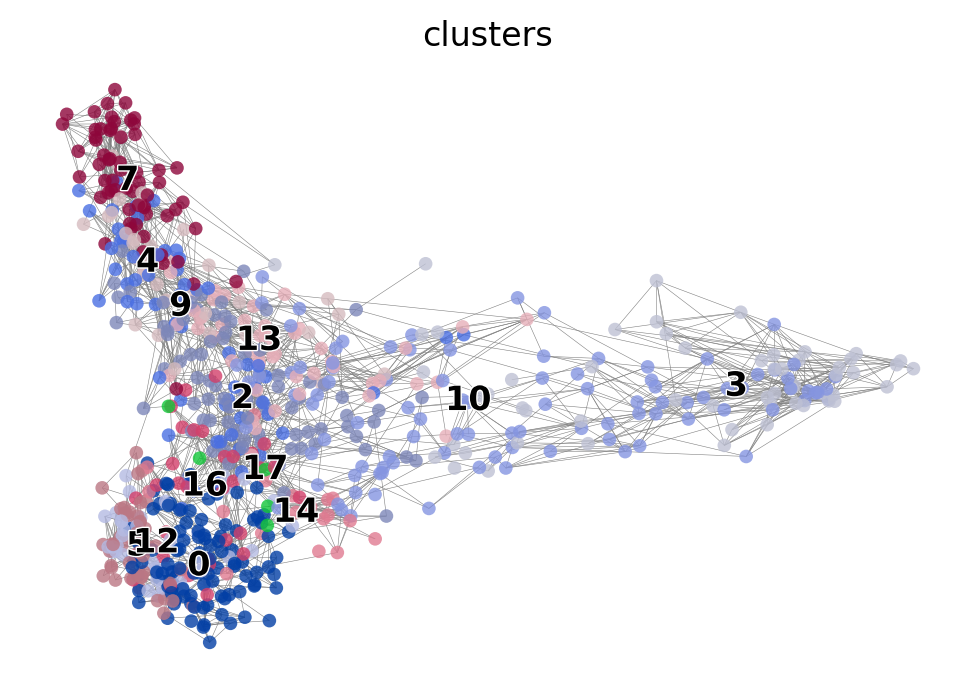

In [44]:
scv.pl.velocity_graph(adata, basis='tsne', threshold=.1)
scv.pl.velocity_graph(adata, basis='pca', threshold=.1)

In [45]:
adata.obs_names

Index(['nc01_zumi:AAGAGGCAAGAGGATAx', 'nc01_zumi:AAGAGGCAAGGCTTAGx',
       'nc01_zumi:AAGAGGCAATAGCCTTx', 'nc01_zumi:AAGAGGCACGGAGAGAx',
       'nc01_zumi:AAGAGGCATATGCAGTx', 'nc01_zumi:AAGAGGCATCGCATAAx',
       'nc01_zumi:AAGAGGCATCTTACGCx', 'nc01_zumi:ACTCGCTAAGAGGATAx',
       'nc01_zumi:ACTCGCTAAGCTAGAAx', 'nc01_zumi:ACTCGCTAAGGCTTAGx',
       ...
       'nc08_zumi:TCGACGTCACTCTAGGx', 'nc08_zumi:TCGACGTCAGAGGATAx',
       'nc08_zumi:TCGACGTCAGCTAGAAx', 'nc08_zumi:TCGACGTCAGGCTTAGx',
       'nc08_zumi:TCGACGTCATAGAGAGx', 'nc08_zumi:TCGACGTCATAGCCTTx',
       'nc08_zumi:TCGACGTCATTAGACGx', 'nc08_zumi:TCGACGTCTACTCCTTx',
       'nc08_zumi:TCGACGTCTATGCAGTx', 'nc08_zumi:TCGACGTCTCTTACGCx'],
      dtype='object', name='CellID', length=697)

In [46]:
# Assuming adata is your AnnData object
matches = adata.obs_names == "nc06_zumi:CGATCAGTAGCTAGAAx"

# To get the indices of the matching entries
matching_indices = np.where(matches)[0]

# To print the indices of the matching entries
for index in matching_indices:
    print(index)

474


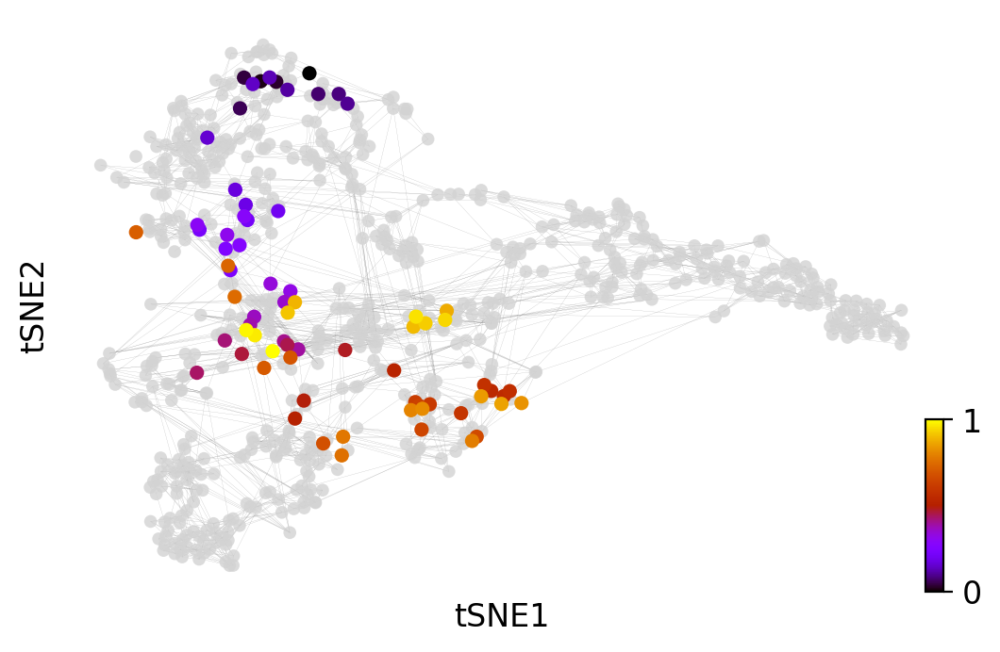

In [47]:
x, y = scv.utils.get_cell_transitions(adata, basis='tsne', starting_cell=474)
ax = scv.pl.velocity_graph(adata, c='lightgrey', basis='tsne', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, basis='tsne', c='ascending', cmap='gnuplot', ax=ax)

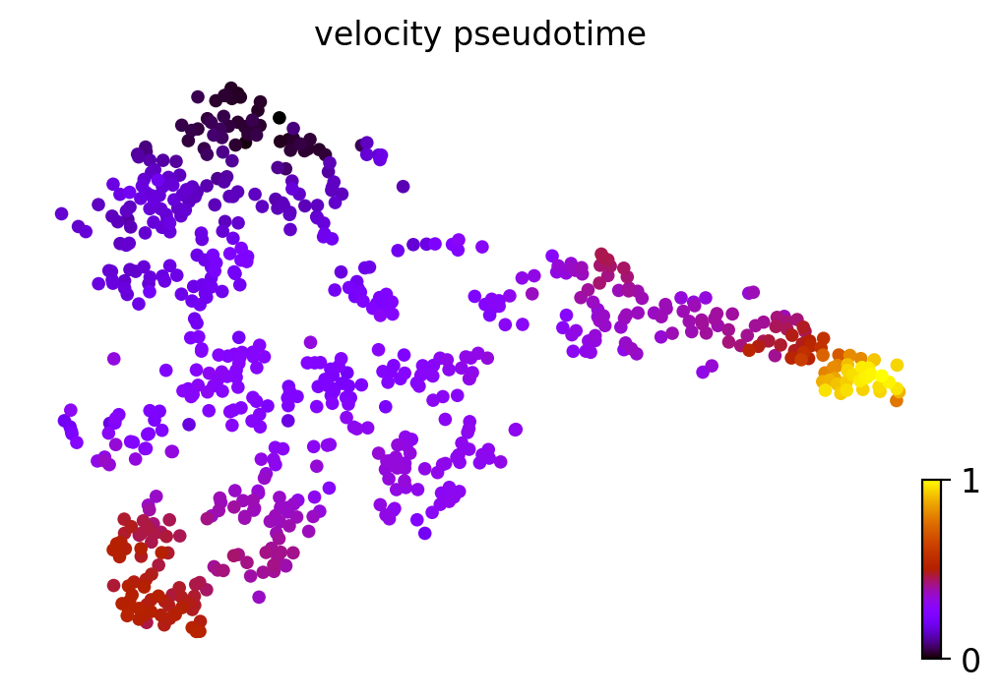

In [48]:
scv.tl.velocity_pseudotime(adata, n_dcs=10, root_key=474)
scv.pl.scatter(adata, basis='tsne', color='velocity_pseudotime', cmap='gnuplot')

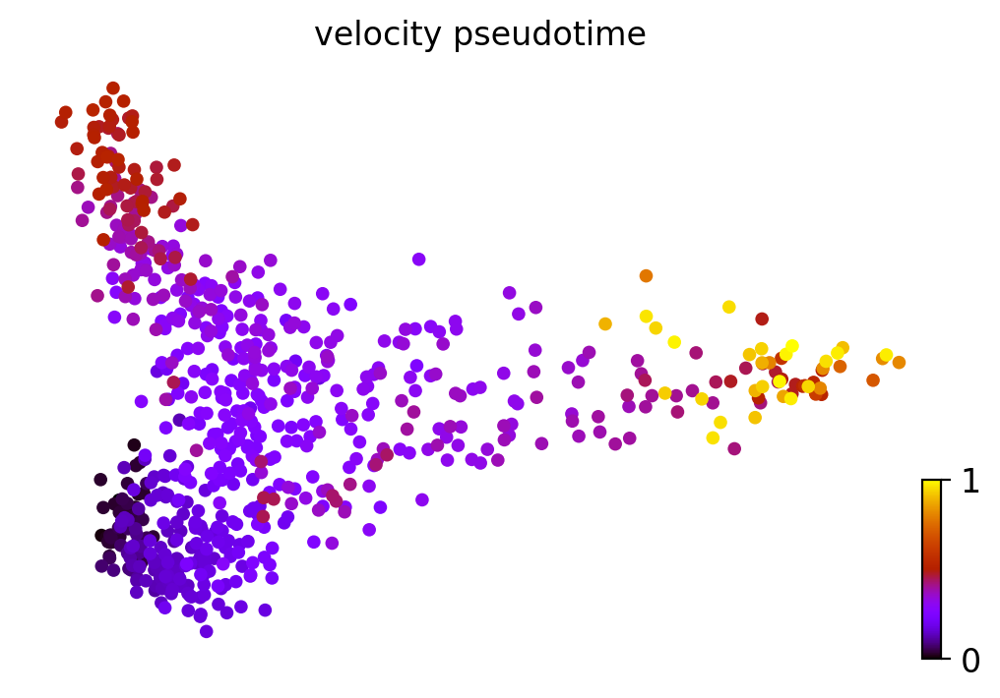

In [49]:
scv.pl.scatter(adata, basis='pca', color='velocity_pseudotime', cmap='gnuplot')

## PAGA velocity graph

In [50]:
#adata.uns['neighbors']['distances'] = adata.obsp['distances']
#adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='cell_type', root_key = 474, 
            minimum_spanning_tree = False, threshold_root_end_prior = 0.5)

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


In [51]:
#df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
#df.style.background_gradient(cmap='Blues').format('{:.2g}')

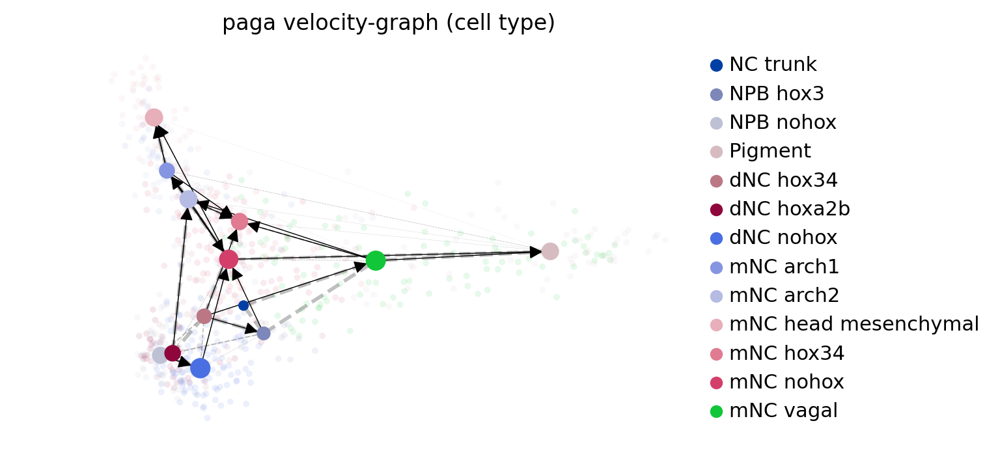

In [52]:
scv.pl.paga(adata, basis='pca', size=50, alpha=.1,root=None,
            min_edge_width=0.5, node_size_scale=0.5)

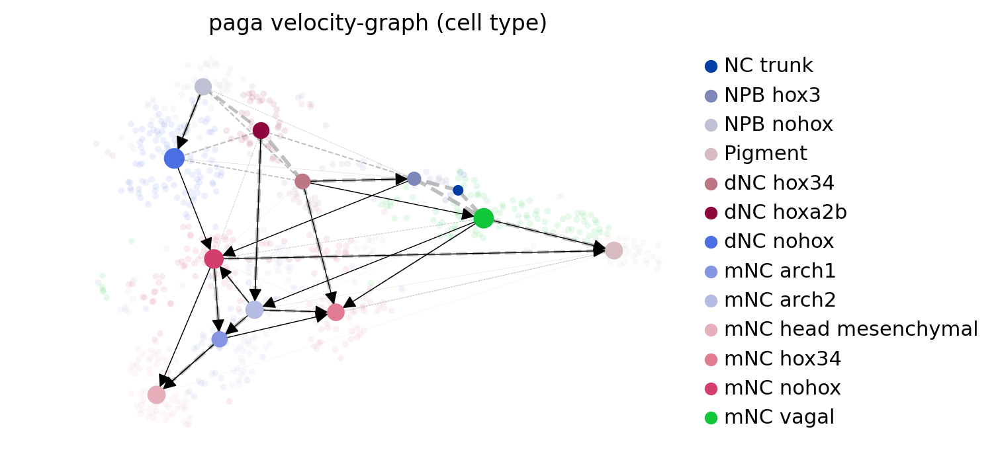

In [53]:
scv.pl.paga(adata, basis='tsne', size=50, alpha=.1,
            min_edge_width=0.5, node_size_scale=0.5)

## Save data

In [55]:
adata.write("../data/scvelo_output/nc01to08_ncwt_scVelo_out.h5ad")